In [3]:
using Pkg
Pkg.activate("../Project.toml")
using Plots
using JLD2
using Random, Distributions
using StatsBase
using Plots.PlotMeasures

include("../LogLoss/RealRealHighDimension.jl");
include("../Imputation/imputation.jl");

  Activating project at `~/Desktop/QuantumInspiredML`


# Difficult Synthetic

In [3]:
function GenerateTrendySine(T::Int = 100; eta::Float64 = 0.1, m::Float64 = 3.0, 
    phi::Float64 = 0.0, tau::Float64=20.0)
    """Generates a noisy trendy sine of length T samples, trend m, and
    corrupted with noisqe of standard deviation 0.1"""
    t = 0:1:(T-1)

    signal = sin.((2π .* t ) ./ tau .+ phi) .+ m/T .* t .+ eta * randn(T)

    return signal

end

GenerateTrendySine (generic function with 2 methods)

# Dataset 1: Fixed Period (T), Varying Trend (2 Vals)

In [26]:
function GenerateDifficultTrendyDataset1(T::Int, num_train::Int, num_test::Int; seed=42)
    """Generate a dataset of simple trendy sines, also return stats on the distribution
    over the varying paramters"""
    Random.seed!(seed)
    num_instances = num_train + num_test
    dataset = Matrix{Float64}(undef, num_instances, T)
    phis = Vector{Float64}(undef, num_instances)
    ms = Vector{Float64}(undef, num_instances)
    for i in 1:num_instances
        phi = rand(Uniform(0, 2π)) # randomise the phase offset by sampling its value from a uniform distribution
        m = rand([-3.0, 3.0])
        phis[i] = phi
        ms[i] = m
        dataset[i, :] = GenerateTrendySine(; phi=phi, m=m)
    end

    # now split into test and train by taking random subsets of the joint dataset
    train_idxs = sample(collect(1:num_instances), num_train, replace=false)
    train_phis = phis[train_idxs]
    train_ms = ms[train_idxs]
    test_idxs = setdiff(collect(1:num_instances), train_idxs)
    test_phis = phis[test_idxs]
    test_ms = ms[test_idxs]

    X_train = dataset[train_idxs, :]
    y_train = Int.(zeros(num_train))

    X_test = dataset[test_idxs, :]
    y_test = Int.(zeros(num_test))

    # keep track of the distribution of phi across test and train
    stats = Dict(
        :train_phis => train_phis,
        :test_phis => test_phis,
        :train_ms => train_ms,
        :test_ms => test_ms

    )

    return X_train, y_train, X_test, y_test, stats

end

GenerateDifficultTrendyDataset1 (generic function with 1 method)

In [44]:
X_train, y_train, X_test, y_test, stats = GenerateDifficultTrendyDataset1(100, 300, 200; seed=1234);

Inspect the distribution over phi and m

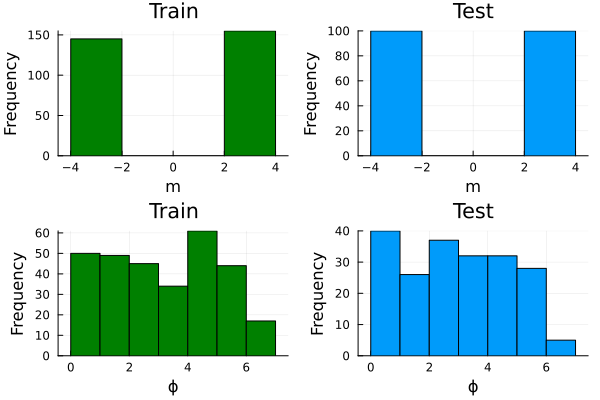

In [45]:
p1 = histogram(stats[:train_ms], ylabel="Frequency", xlabel="m", label="", title="Train", c=:green)
p2 = histogram(stats[:test_ms], ylabel="Frequency", xlabel="m", label="", title="Test")
p3 = histogram(stats[:train_phis], ylabel="Frequency", xlabel="ϕ", label="", title="Train", c=:green)
p4 = histogram(stats[:test_phis], ylabel="Frequency", xlabel="ϕ", label="", title="Test")
plot(p1, p2, p3, p4)

Inspect random examples:

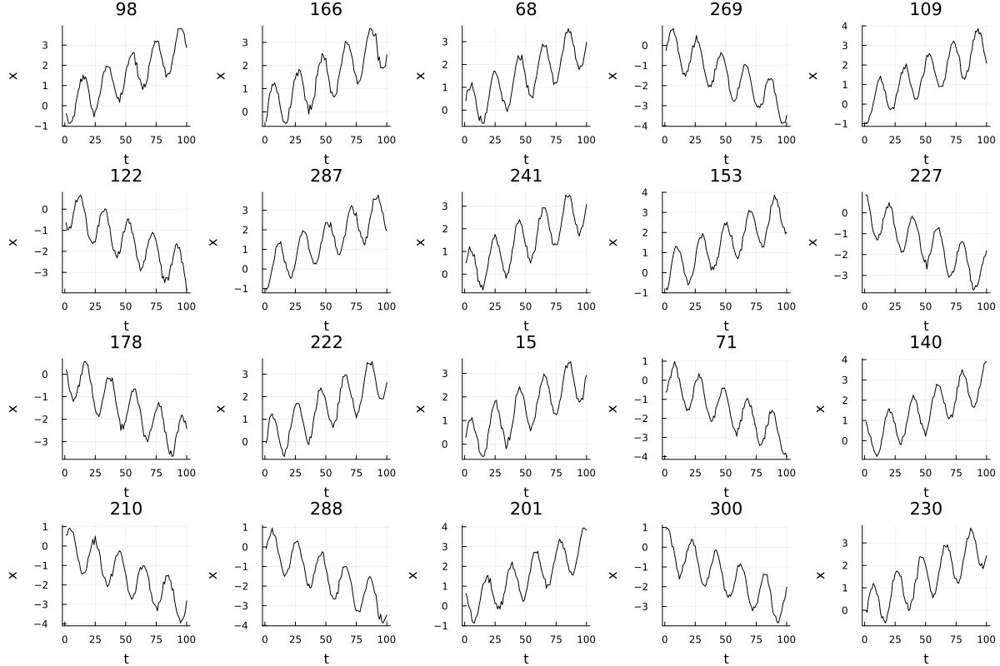

In [48]:
Random.seed!(1234)
plot_idxs = sample(1:300, 20; replace=false);
ps = []
for pidx in plot_idxs
    p = plot(X_train[pidx, :], label ="", c=:black, title=pidx, xlabel="t", ylabel="x")
    push!(ps, p)
end
plot(ps..., size=(1200, 800), left_margin=5mm)

Save dataset 1:

In [50]:
# jldopen("noisy_trendy_sine_eta_01_m_var2_tau_20.jld2", "w") do f
#     f["X_train"] = X_train
#     f["y_train"] = y_train
#     f["X_test"] = X_test
#     f["y_test"] = y_test
#     f["stats"] = stats
# end

Dict{Symbol, Vector{Float64}} with 4 entries:
  :train_ms   => [-3.0, -3.0, -3.0, 3.0, 3.0, -3.0, -3.0, 3.0, -3.0, -3.0  …  3…
  :test_ms    => [-3.0, 3.0, 3.0, -3.0, 3.0, -3.0, 3.0, 3.0, 3.0, -3.0  …  -3.0…
  :train_phis => [1.62229, 0.830395, 4.17282, 3.30727, 3.09957, 5.85326, 0.7179…
  :test_phis  => [3.50977, 4.40644, 0.322557, 2.6503, 5.55216, 1.59138, 3.52475…

# Dataset 2: Fixed Trend (m), Varying Period (2 Vals)

In [64]:
function GenerateDifficultTrendyDataset2(T::Int, num_train::Int, num_test::Int; seed=42)
    """Generate a dataset of simple trendy sines, also return stats on the distribution
    over the varying paramters"""
    Random.seed!(seed)
    num_instances = num_train + num_test
    dataset = Matrix{Float64}(undef, num_instances, T)
    phis = Vector{Float64}(undef, num_instances)
    taus = Vector{Float64}(undef, num_instances)
    for i in 1:num_instances
        phi = rand(Uniform(0, 2π)) # randomise the phase offset by sampling its value from a uniform distribution
        tau = rand([20.0, 40.0])
        phis[i] = phi
        taus[i] = tau
        dataset[i, :] = GenerateTrendySine(; phi=phi, tau=tau)
    end

    # now split into test and train by taking random subsets of the joint dataset
    train_idxs = sample(collect(1:num_instances), num_train, replace=false)
    train_phis = phis[train_idxs]
    train_taus = taus[train_idxs]
    test_idxs = setdiff(collect(1:num_instances), train_idxs)
    test_phis = phis[test_idxs]
    test_taus = taus[test_idxs]

    X_train = dataset[train_idxs, :]
    y_train = Int.(zeros(num_train))

    X_test = dataset[test_idxs, :]
    y_test = Int.(zeros(num_test))

    # keep track of the distribution of phi across test and train
    stats = Dict(
        :train_phis => train_phis,
        :test_phis => test_phis,
        :train_taus => train_taus,
        :test_taus => test_taus

    )

    return X_train, y_train, X_test, y_test, stats

end

GenerateDifficultTrendyDataset2 (generic function with 1 method)

In [72]:
X_train, y_train, X_test, y_test, stats = GenerateDifficultTrendyDataset2(100, 300, 200; seed=875);

Inspect the distribution over $\tau$ and $\phi$

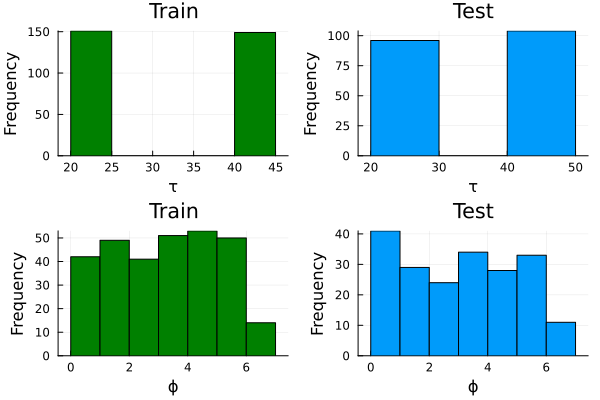

In [73]:
p1 = histogram(stats[:train_taus], ylabel="Frequency", xlabel="τ", label="", title="Train", c=:green)
p2 = histogram(stats[:test_taus], ylabel="Frequency", xlabel="τ", label="", title="Test")
p3 = histogram(stats[:train_phis], ylabel="Frequency", xlabel="ϕ", label="", title="Train", c=:green)
p4 = histogram(stats[:test_phis], ylabel="Frequency", xlabel="ϕ", label="", title="Test")
plot(p1, p2, p3, p4)

Inspect some examples:

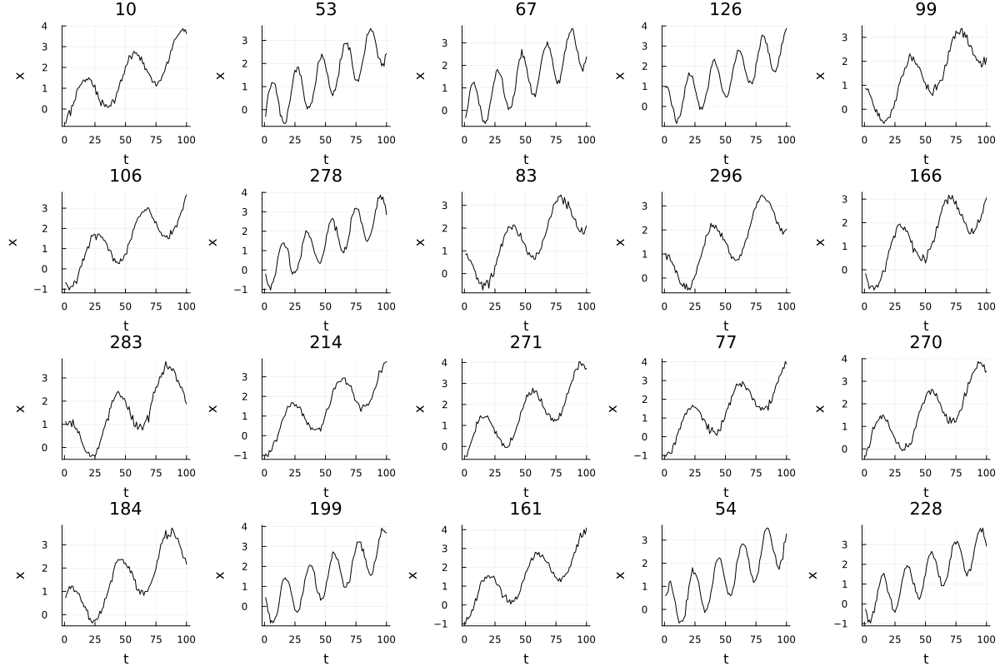

In [74]:
Random.seed!(134)
plot_idxs = sample(1:300, 20; replace=false);
ps = []
for pidx in plot_idxs
    p = plot(X_train[pidx, :], label ="", c=:black, title=pidx, xlabel="t", ylabel="x")
    push!(ps, p)
end
plot(ps..., size=(1200, 800), left_margin=5mm)

Save dataset 2:

In [75]:
# jldopen("noisy_trendy_sine_eta_01_m_3_tau_var2.jld2", "w") do f
#     f["X_train"] = X_train
#     f["y_train"] = y_train
#     f["X_test"] = X_test
#     f["y_test"] = y_test
#     f["stats"] = stats
# end

Dict{Symbol, Vector{Float64}} with 4 entries:
  :train_taus => [20.0, 40.0, 40.0, 40.0, 20.0, 20.0, 40.0, 40.0, 20.0, 40.0  ……
  :test_taus  => [40.0, 40.0, 40.0, 40.0, 40.0, 20.0, 40.0, 40.0, 20.0, 20.0  ……
  :train_phis => [2.43473, 5.03829, 2.80043, 3.36954, 3.61051, 5.31313, 1.37584…
  :test_phis  => [0.946013, 2.55806, 4.37488, 6.07171, 5.84171, 0.740579, 3.261…

# Dataset 3: Varying Trend (2 vals), Varying Period (2 Vals)

In [80]:
function GenerateDifficultTrendyDataset3(T::Int, num_train::Int, num_test::Int; seed=42)
    """Generate a dataset of simple trendy sines, also return stats on the distribution
    over the varying paramters"""
    Random.seed!(seed)
    num_instances = num_train + num_test
    dataset = Matrix{Float64}(undef, num_instances, T)
    phis = Vector{Float64}(undef, num_instances)
    taus = Vector{Float64}(undef, num_instances)
    ms = Vector{Float64}(undef, num_instances)
    for i in 1:num_instances
        phi = rand(Uniform(0, 2π)) # randomise the phase offset by sampling its value from a uniform distribution
        tau = rand([20.0, 40.0])
        m = rand([-3.0, 3.0])
        phis[i] = phi
        taus[i] = tau
        ms[i] = m
        dataset[i, :] = GenerateTrendySine(; phi=phi, tau=tau, m=m)
    end

    # now split into test and train by taking random subsets of the joint dataset
    train_idxs = sample(collect(1:num_instances), num_train, replace=false)
    train_phis = phis[train_idxs]
    train_taus = taus[train_idxs]
    train_ms = ms[train_idxs]
    test_idxs = setdiff(collect(1:num_instances), train_idxs)
    test_phis = phis[test_idxs]
    test_taus = taus[test_idxs]
    test_ms = ms[test_idxs]

    X_train = dataset[train_idxs, :]
    y_train = Int.(zeros(num_train))

    X_test = dataset[test_idxs, :]
    y_test = Int.(zeros(num_test))

    # keep track of the distribution of phi across test and train
    stats = Dict(
        :train_phis => train_phis,
        :test_phis => test_phis,
        :train_taus => train_taus,
        :test_taus => test_taus,
        :train_ms => train_ms, 
        :test_ms => test_ms

    )

    return X_train, y_train, X_test, y_test, stats

end

GenerateDifficultTrendyDataset3 (generic function with 1 method)

In [94]:
X_train, y_train, X_test, y_test, stats = GenerateDifficultTrendyDataset3(100, 300, 200; seed=85);

Inspect the distributions over phi, m and $\tau$

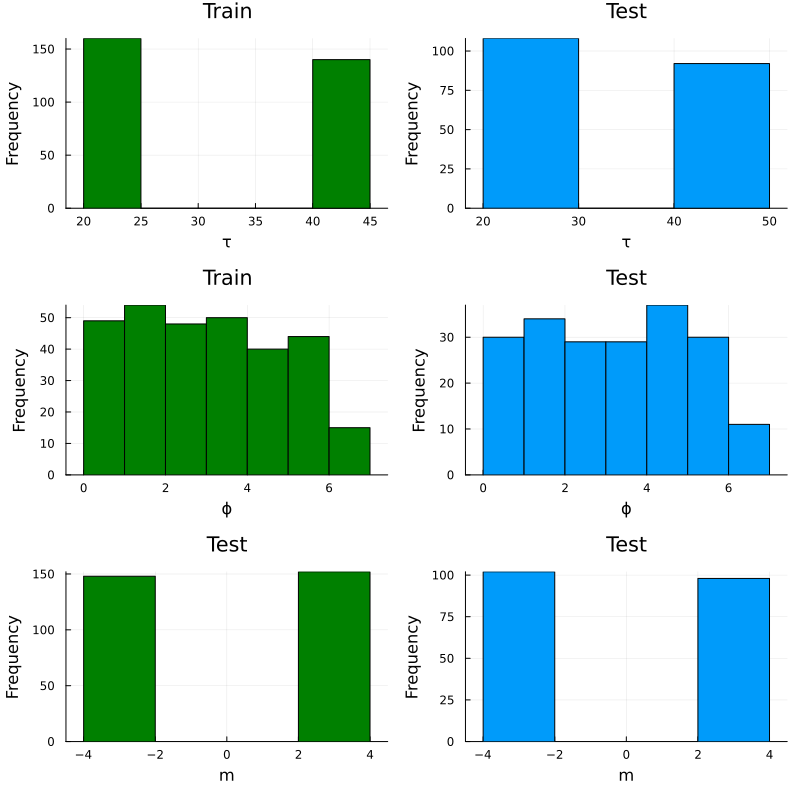

In [95]:
p1 = histogram(stats[:train_taus], ylabel="Frequency", xlabel="τ", label="", title="Train", c=:green)
p2 = histogram(stats[:test_taus], ylabel="Frequency", xlabel="τ", label="", title="Test")
p3 = histogram(stats[:train_phis], ylabel="Frequency", xlabel="ϕ", label="", title="Train", c=:green)
p4 = histogram(stats[:test_phis], ylabel="Frequency", xlabel="ϕ", label="", title="Test")
p5 = histogram(stats[:train_ms], ylabel="Frequency", xlabel="m", label="", title="Test", c=:green)
p6 = histogram(stats[:test_ms], ylabel="Frequency", xlabel="m", label="", title="Test")
plot(p1, p2, p3, p4, p5, p6, layout=(3, 2), size=(800, 800))

Inspect some examples:

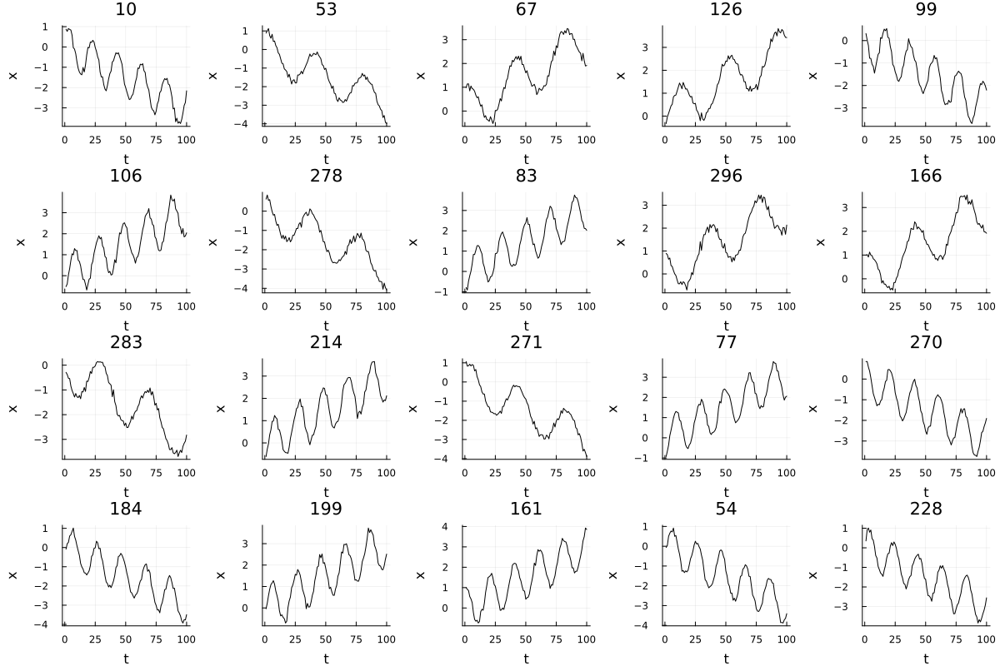

In [96]:
Random.seed!(134)
plot_idxs = sample(1:300, 20; replace=false);
ps = []
for pidx in plot_idxs
    p = plot(X_train[pidx, :], label ="", c=:black, title=pidx, xlabel="t", ylabel="x")
    push!(ps, p)
end
plot(ps..., size=(1200, 800), left_margin=5mm)

save dataset 3

In [97]:
# jldopen("noisy_trendy_sine_eta_01_m_var2_tau_var2.jld2", "w") do f
#     f["X_train"] = X_train
#     f["y_train"] = y_train
#     f["X_test"] = X_test
#     f["y_test"] = y_test
#     f["stats"] = stats
# end

Dict{Symbol, Vector{Float64}} with 6 entries:
  :train_ms   => [3.0, 3.0, 3.0, -3.0, -3.0, 3.0, 3.0, 3.0, 3.0, -3.0  …  3.0, …
  :train_taus => [40.0, 20.0, 40.0, 40.0, 20.0, 40.0, 20.0, 40.0, 40.0, 20.0  ……
  :test_taus  => [20.0, 40.0, 40.0, 40.0, 40.0, 20.0, 20.0, 40.0, 40.0, 40.0  ……
  :test_ms    => [3.0, 3.0, -3.0, -3.0, -3.0, 3.0, -3.0, -3.0, -3.0, 3.0  …  -3…
  :train_phis => [3.97549, 2.32648, 2.76958, 0.524181, 3.33394, 5.94298, 3.8670…
  :test_phis  => [3.9695, 1.44499, 2.09648, 0.880558, 4.89555, 0.579281, 4.7719…

# Dataset 4: Varying Trend (3 vals), Varying Period (2 Vals)

In [98]:
function GenerateDifficultTrendyDataset4(T::Int, num_train::Int, num_test::Int; seed=42)
    """Generate a dataset of simple trendy sines, also return stats on the distribution
    over the varying paramters"""
    Random.seed!(seed)
    num_instances = num_train + num_test
    dataset = Matrix{Float64}(undef, num_instances, T)
    phis = Vector{Float64}(undef, num_instances)
    taus = Vector{Float64}(undef, num_instances)
    ms = Vector{Float64}(undef, num_instances)
    for i in 1:num_instances
        phi = rand(Uniform(0, 2π)) # randomise the phase offset by sampling its value from a uniform distribution
        tau = rand([20.0, 40.0])
        m = rand([-3.0, 0.0, 3.0])
        phis[i] = phi
        taus[i] = tau
        ms[i] = m
        dataset[i, :] = GenerateTrendySine(; phi=phi, tau=tau, m=m)
    end

    # now split into test and train by taking random subsets of the joint dataset
    train_idxs = sample(collect(1:num_instances), num_train, replace=false)
    train_phis = phis[train_idxs]
    train_taus = taus[train_idxs]
    train_ms = ms[train_idxs]
    test_idxs = setdiff(collect(1:num_instances), train_idxs)
    test_phis = phis[test_idxs]
    test_taus = taus[test_idxs]
    test_ms = ms[test_idxs]

    X_train = dataset[train_idxs, :]
    y_train = Int.(zeros(num_train))

    X_test = dataset[test_idxs, :]
    y_test = Int.(zeros(num_test))

    # keep track of the distribution of phi across test and train
    stats = Dict(
        :train_phis => train_phis,
        :test_phis => test_phis,
        :train_taus => train_taus,
        :test_taus => test_taus,
        :train_ms => train_ms, 
        :test_ms => test_ms

    )

    return X_train, y_train, X_test, y_test, stats

end

GenerateDifficultTrendyDataset4 (generic function with 1 method)

In [106]:
X_train, y_train, X_test, y_test, stats = GenerateDifficultTrendyDataset4(100, 300, 200; seed=95);

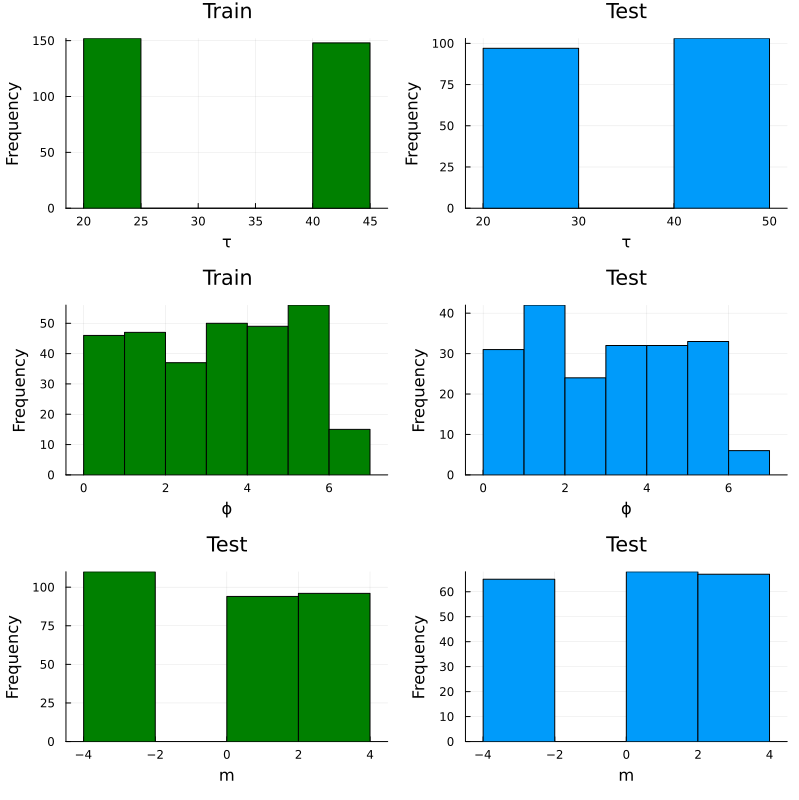

In [107]:
p1 = histogram(stats[:train_taus], ylabel="Frequency", xlabel="τ", label="", title="Train", c=:green)
p2 = histogram(stats[:test_taus], ylabel="Frequency", xlabel="τ", label="", title="Test")
p3 = histogram(stats[:train_phis], ylabel="Frequency", xlabel="ϕ", label="", title="Train", c=:green)
p4 = histogram(stats[:test_phis], ylabel="Frequency", xlabel="ϕ", label="", title="Test")
p5 = histogram(stats[:train_ms], ylabel="Frequency", xlabel="m", label="", title="Test", c=:green)
p6 = histogram(stats[:test_ms], ylabel="Frequency", xlabel="m", label="", title="Test")
plot(p1, p2, p3, p4, p5, p6, layout=(3, 2), size=(800, 800))

Inspecting examples:

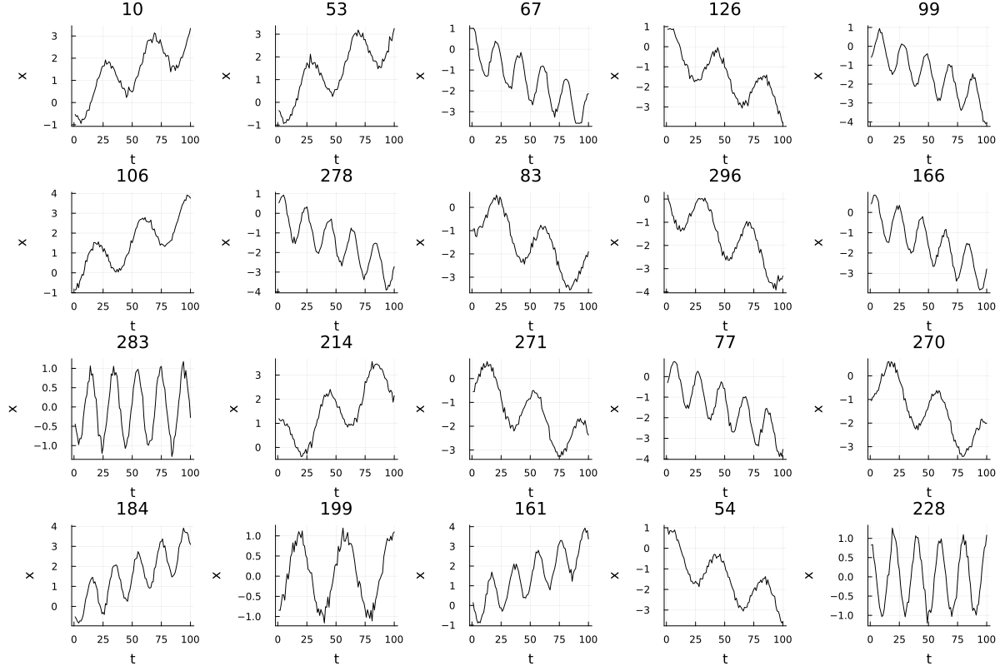

In [108]:
Random.seed!(134)
plot_idxs = sample(1:300, 20; replace=false);
ps = []
for pidx in plot_idxs
    p = plot(X_train[pidx, :], label ="", c=:black, title=pidx, xlabel="t", ylabel="x")
    push!(ps, p)
end
plot(ps..., size=(1200, 800), left_margin=5mm)

save dataset 4

In [118]:
# jldopen("noisy_trendy_sine_eta_01_m_var3_tau_var2.jld2", "w") do f
#     f["X_train"] = X_train
#     f["y_train"] = y_train
#     f["X_test"] = X_test
#     f["y_test"] = y_test
#     f["stats"] = stats
# end

Dict{Symbol, Vector{Float64}} with 6 entries:
  :train_ms   => [0.0, 0.0, -3.0, -3.0, 0.0, 0.0, -3.0, 3.0, 3.0, 3.0  …  3.0, …
  :train_taus => [40.0, 20.0, 40.0, 40.0, 40.0, 40.0, 20.0, 20.0, 20.0, 40.0  ……
  :test_taus  => [40.0, 40.0, 40.0, 20.0, 40.0, 40.0, 20.0, 20.0, 40.0, 40.0  ……
  :test_ms    => [-3.0, 3.0, 3.0, -3.0, 3.0, 3.0, 0.0, 3.0, -3.0, 3.0  …  0.0, …
  :train_phis => [5.77018, 5.69695, 2.51143, 4.90566, 1.25723, 5.599, 3.77696, …
  :test_phis  => [2.42418, 2.37603, 3.87796, 5.84118, 3.99457, 5.35569, 0.95860…

# Dataset 5: Varying Trend (2 vals), Varying Period (3 Vals)

In [131]:
function GenerateDifficultTrendyDataset5(T::Int, num_train::Int, num_test::Int; seed=42)
    """Generate a dataset of simple trendy sines, also return stats on the distribution
    over the varying paramters"""
    Random.seed!(seed)
    num_instances = num_train + num_test
    dataset = Matrix{Float64}(undef, num_instances, T)
    phis = Vector{Float64}(undef, num_instances)
    taus = Vector{Float64}(undef, num_instances)
    ms = Vector{Float64}(undef, num_instances)
    for i in 1:num_instances
        phi = rand(Uniform(0, 2π)) # randomise the phase offset by sampling its value from a uniform distribution
        tau = rand([20.0, 30.0, 40.0])
        m = rand([-3.0, 3.0])
        phis[i] = phi
        taus[i] = tau
        ms[i] = m
        dataset[i, :] = GenerateTrendySine(; phi=phi, tau=tau, m=m)
    end

    # now split into test and train by taking random subsets of the joint dataset
    train_idxs = sample(collect(1:num_instances), num_train, replace=false)
    train_phis = phis[train_idxs]
    train_taus = taus[train_idxs]
    train_ms = ms[train_idxs]
    test_idxs = setdiff(collect(1:num_instances), train_idxs)
    test_phis = phis[test_idxs]
    test_taus = taus[test_idxs]
    test_ms = ms[test_idxs]

    X_train = dataset[train_idxs, :]
    y_train = Int.(zeros(num_train))

    X_test = dataset[test_idxs, :]
    y_test = Int.(zeros(num_test))

    # keep track of the distribution of phi across test and train
    stats = Dict(
        :train_phis => train_phis,
        :test_phis => test_phis,
        :train_taus => train_taus,
        :test_taus => test_taus,
        :train_ms => train_ms, 
        :test_ms => test_ms

    )

    return X_train, y_train, X_test, y_test, stats

end

GenerateDifficultTrendyDataset5 (generic function with 1 method)

In [156]:
X_train, y_train, X_test, y_test, stats = GenerateDifficultTrendyDataset5(100, 300, 200; seed=256);

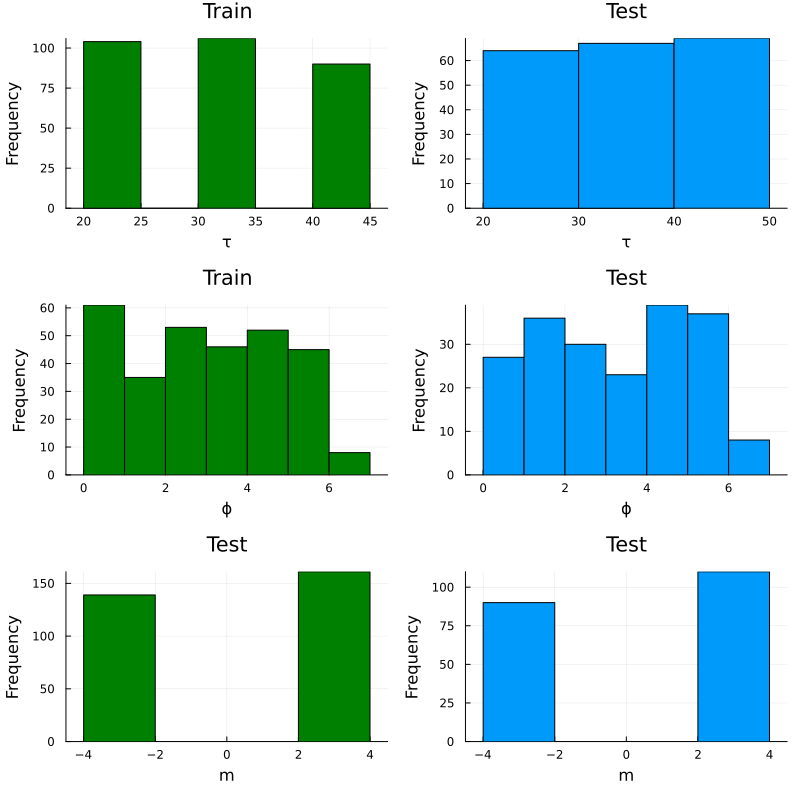

In [157]:
p1 = histogram(stats[:train_taus], ylabel="Frequency", xlabel="τ", label="", title="Train", c=:green)
p2 = histogram(stats[:test_taus], ylabel="Frequency", xlabel="τ", label="", title="Test")
p3 = histogram(stats[:train_phis], ylabel="Frequency", xlabel="ϕ", label="", title="Train", c=:green)
p4 = histogram(stats[:test_phis], ylabel="Frequency", xlabel="ϕ", label="", title="Test")
p5 = histogram(stats[:train_ms], ylabel="Frequency", xlabel="m", label="", title="Test", c=:green)
p6 = histogram(stats[:test_ms], ylabel="Frequency", xlabel="m", label="", title="Test")
plot(p1, p2, p3, p4, p5, p6, layout=(3, 2), size=(800, 800))

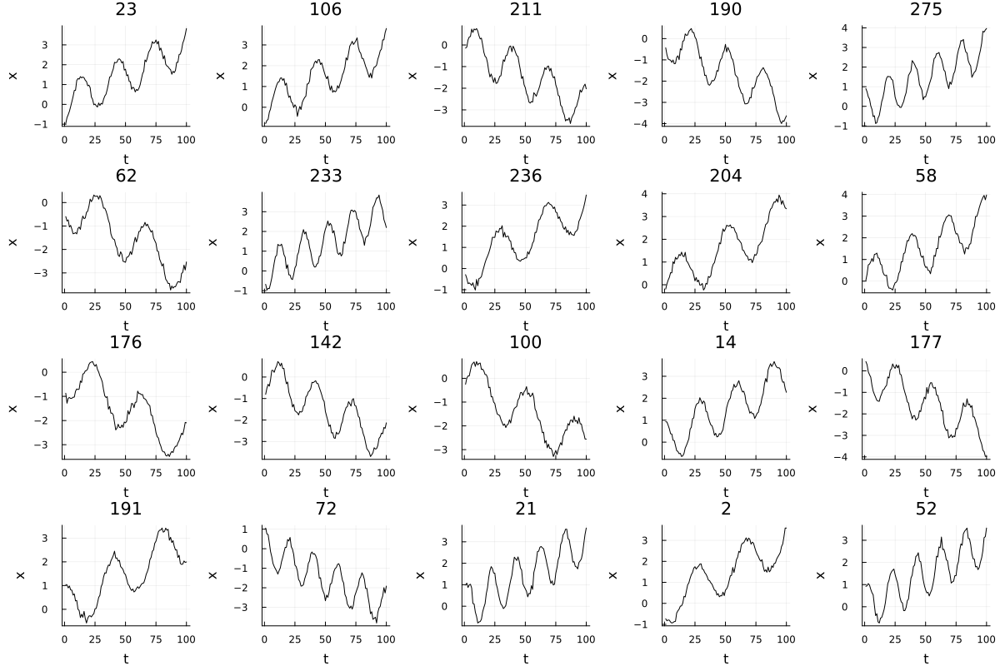

In [162]:
Random.seed!(1)
plot_idxs = sample(1:300, 20; replace=false);
ps = []
for pidx in plot_idxs
    p = plot(X_train[pidx, :], label ="", c=:black, title=pidx, xlabel="t", ylabel="x")
    push!(ps, p)
end
plot(ps..., size=(1200, 800), left_margin=5mm)

save dataset 5

In [163]:
# jldopen("noisy_trendy_sine_eta_01_m_var2_tau_var3.jld2", "w") do f
#     f["X_train"] = X_train
#     f["y_train"] = y_train
#     f["X_test"] = X_test
#     f["y_test"] = y_test
#     f["stats"] = stats
# end

Dict{Symbol, Vector{Float64}} with 6 entries:
  :train_ms   => [-3.0, 3.0, -3.0, 3.0, -3.0, -3.0, -3.0, -3.0, 3.0, -3.0  …  3…
  :train_taus => [40.0, 40.0, 20.0, 40.0, 20.0, 20.0, 40.0, 40.0, 20.0, 20.0  ……
  :test_taus  => [20.0, 30.0, 20.0, 40.0, 40.0, 30.0, 30.0, 20.0, 20.0, 30.0  ……
  :test_ms    => [-3.0, 3.0, -3.0, -3.0, 3.0, -3.0, 3.0, 3.0, -3.0, 3.0  …  -3.…
  :train_phis => [0.101279, 3.80446, 3.80272, 3.12078, 3.84592, 2.66396, 2.5289…
  :test_phis  => [3.55067, 2.48107, 3.59492, 5.77812, 3.07061, 2.48938, 1.64605…

# Dataset 6: Varying Trend (3 vals), Varying Period (3 Vals)

In [164]:
function GenerateDifficultTrendyDataset6(T::Int, num_train::Int, num_test::Int; seed=42)
    """Generate a dataset of simple trendy sines, also return stats on the distribution
    over the varying paramters"""
    Random.seed!(seed)
    num_instances = num_train + num_test
    dataset = Matrix{Float64}(undef, num_instances, T)
    phis = Vector{Float64}(undef, num_instances)
    taus = Vector{Float64}(undef, num_instances)
    ms = Vector{Float64}(undef, num_instances)
    for i in 1:num_instances
        phi = rand(Uniform(0, 2π)) # randomise the phase offset by sampling its value from a uniform distribution
        tau = rand([20.0, 30.0, 40.0])
        m = rand([-3.0, 0.0, 3.0])
        phis[i] = phi
        taus[i] = tau
        ms[i] = m
        dataset[i, :] = GenerateTrendySine(; phi=phi, tau=tau, m=m)
    end

    # now split into test and train by taking random subsets of the joint dataset
    train_idxs = sample(collect(1:num_instances), num_train, replace=false)
    train_phis = phis[train_idxs]
    train_taus = taus[train_idxs]
    train_ms = ms[train_idxs]
    test_idxs = setdiff(collect(1:num_instances), train_idxs)
    test_phis = phis[test_idxs]
    test_taus = taus[test_idxs]
    test_ms = ms[test_idxs]

    X_train = dataset[train_idxs, :]
    y_train = Int.(zeros(num_train))

    X_test = dataset[test_idxs, :]
    y_test = Int.(zeros(num_test))

    # keep track of the distribution of phi across test and train
    stats = Dict(
        :train_phis => train_phis,
        :test_phis => test_phis,
        :train_taus => train_taus,
        :test_taus => test_taus,
        :train_ms => train_ms, 
        :test_ms => test_ms

    )

    return X_train, y_train, X_test, y_test, stats

end

GenerateDifficultTrendyDataset6 (generic function with 1 method)

In [201]:
X_train, y_train, X_test, y_test, stats = GenerateDifficultTrendyDataset6(100, 300, 200; seed=4223);

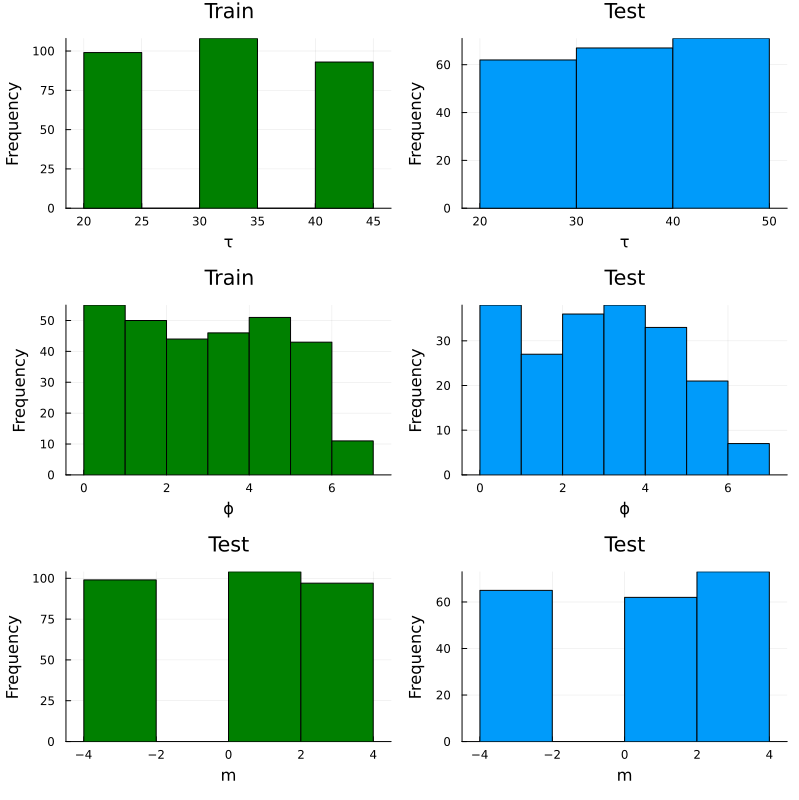

In [202]:
p1 = histogram(stats[:train_taus], ylabel="Frequency", xlabel="τ", label="", title="Train", c=:green)
p2 = histogram(stats[:test_taus], ylabel="Frequency", xlabel="τ", label="", title="Test")
p3 = histogram(stats[:train_phis], ylabel="Frequency", xlabel="ϕ", label="", title="Train", c=:green)
p4 = histogram(stats[:test_phis], ylabel="Frequency", xlabel="ϕ", label="", title="Test")
p5 = histogram(stats[:train_ms], ylabel="Frequency", xlabel="m", label="", title="Test", c=:green)
p6 = histogram(stats[:test_ms], ylabel="Frequency", xlabel="m", label="", title="Test")
plot(p1, p2, p3, p4, p5, p6, layout=(3, 2), size=(800, 800))

In [203]:
jldopen("noisy_trendy_sine_eta_01_m_var3_tau_var3.jld2", "w") do f
    f["X_train"] = X_train
    f["y_train"] = y_train
    f["X_test"] = X_test
    f["y_test"] = y_test
    f["stats"] = stats
end

Dict{Symbol, Vector{Float64}} with 6 entries:
  :train_ms   => [3.0, 3.0, -3.0, -3.0, 3.0, 3.0, 3.0, 3.0, -3.0, 0.0  …  -3.0,…
  :train_taus => [30.0, 20.0, 30.0, 30.0, 20.0, 40.0, 30.0, 30.0, 20.0, 30.0  ……
  :test_taus  => [40.0, 40.0, 30.0, 30.0, 30.0, 40.0, 40.0, 30.0, 40.0, 20.0  ……
  :test_ms    => [3.0, -3.0, 3.0, 0.0, -3.0, -3.0, 3.0, 3.0, -3.0, 3.0  …  3.0,…
  :train_phis => [3.42095, 3.95265, 3.5953, 6.04283, 6.04931, 1.44116, 4.85314,…
  :test_phis  => [3.11339, 3.21767, 6.10636, 0.589144, 0.791516, 3.39717, 2.103…

# Dataset 7: Fixed Period (1), Varying Trend (3)

In [470]:
function GenerateDifficultTrendyDataset7(T::Int, num_train::Int, num_test::Int; seed=42)
    """Generate a dataset of simple trendy sines, also return stats on the distribution
    over the varying paramters"""
    Random.seed!(seed)
    num_instances = num_train + num_test
    dataset = Matrix{Float64}(undef, num_instances, T)
    phis = Vector{Float64}(undef, num_instances)
    ms = Vector{Float64}(undef, num_instances)
    for i in 1:num_instances
        phi = rand(Uniform(0, 2π)) # randomise the phase offset by sampling its value from a uniform distribution
        m = rand([-3.0, 0.0, 3.0])
        phis[i] = phi
        ms[i] = m
        dataset[i, :] = GenerateTrendySine(; phi=phi, m=m)
    end

    # now split into test and train by taking random subsets of the joint dataset
    train_idxs = sample(collect(1:num_instances), num_train, replace=false)
    train_phis = phis[train_idxs]
    train_ms = ms[train_idxs]
    test_idxs = setdiff(collect(1:num_instances), train_idxs)
    test_phis = phis[test_idxs]
    test_ms = ms[test_idxs]

    X_train = dataset[train_idxs, :]
    y_train = Int.(zeros(num_train))

    X_test = dataset[test_idxs, :]
    y_test = Int.(zeros(num_test))

    # keep track of the distribution of phi across test and train
    stats = Dict(
        :train_phis => train_phis,
        :test_phis => test_phis,
        :train_ms => train_ms, 
        :test_ms => test_ms

    )

    return X_train, y_train, X_test, y_test, stats

end

GenerateDifficultTrendyDataset7 (generic function with 1 method)

In [477]:
X_train, y_train, X_test, y_test, stats = GenerateDifficultTrendyDataset7(100, 300, 200; seed=2566573);

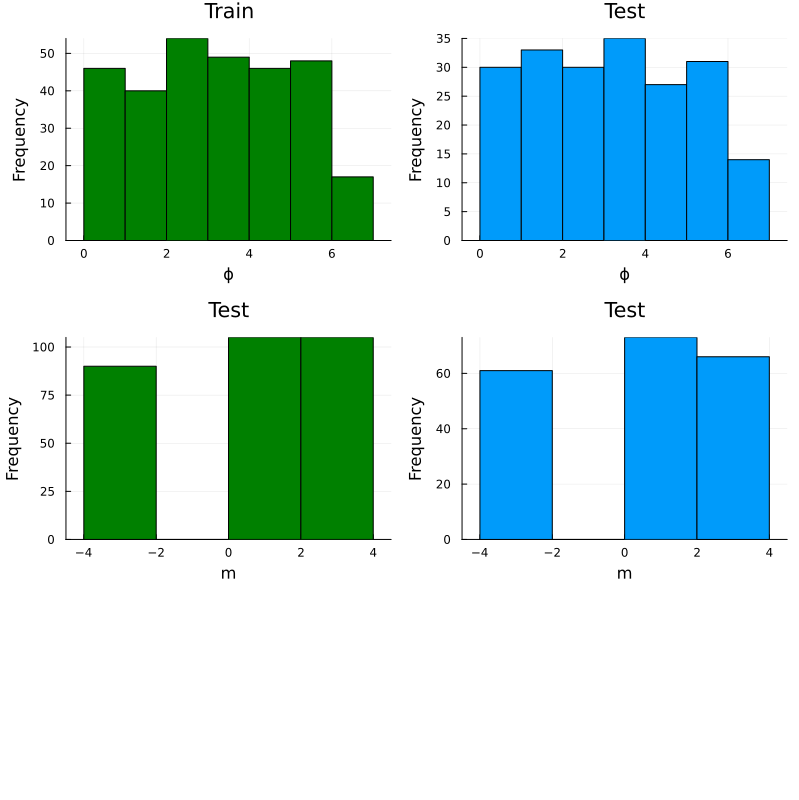

In [478]:
p1 = histogram(stats[:train_phis], ylabel="Frequency", xlabel="ϕ", label="", title="Train", c=:green)
p2 = histogram(stats[:test_phis], ylabel="Frequency", xlabel="ϕ", label="", title="Test")
p3 = histogram(stats[:train_ms], ylabel="Frequency", xlabel="m", label="", title="Test", c=:green)
p4 = histogram(stats[:test_ms], ylabel="Frequency", xlabel="m", label="", title="Test")
plot(p1, p2, p3, p4, layout=(3, 2), size=(800, 800))

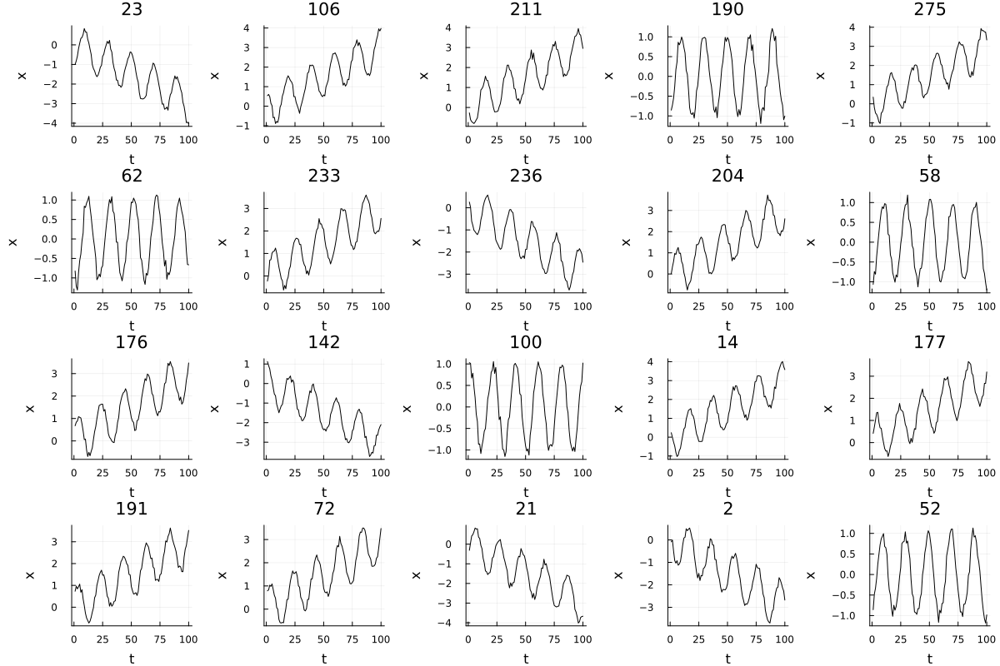

In [479]:
Random.seed!(1)
plot_idxs = sample(1:300, 20; replace=false);
ps = []
for pidx in plot_idxs
    p = plot(X_train[pidx, :], label ="", c=:black, title=pidx, xlabel="t", ylabel="x")
    push!(ps, p)
end
plot(ps..., size=(1200, 800), left_margin=5mm)

In [480]:
jldopen("noisy_trendy_sine_eta_01_m_var3_tau_20.jld2", "w") do f
    f["X_train"] = X_train
    f["y_train"] = y_train
    f["X_test"] = X_test
    f["y_test"] = y_test
    f["stats"] = stats
end

Dict{Symbol, Vector{Float64}} with 4 entries:
  :train_ms   => [3.0, -3.0, 3.0, 3.0, -3.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0…
  :test_ms    => [0.0, 0.0, 3.0, 3.0, -3.0, -3.0, -3.0, -3.0, -3.0, -3.0  …  3.…
  :train_phis => [0.451097, 3.13129, 4.91789, 3.12369, 2.71801, 5.96223, 4.9737…
  :test_phis  => [3.5953, 4.51561, 2.13262, 6.28077, 3.19392, 5.74876, 6.19094,…

# Dataset 8: Varying Period (3), Fixed Trend (1)

In [483]:
function GenerateDifficultTrendyDataset8(T::Int, num_train::Int, num_test::Int; seed=42)
    """Generate a dataset of simple trendy sines, also return stats on the distribution
    over the varying paramters"""
    Random.seed!(seed)
    num_instances = num_train + num_test
    dataset = Matrix{Float64}(undef, num_instances, T)
    phis = Vector{Float64}(undef, num_instances)
    taus = Vector{Float64}(undef, num_instances)
    for i in 1:num_instances
        phi = rand(Uniform(0, 2π)) # randomise the phase offset by sampling its value from a uniform distribution
        tau = rand([20.0, 30.0, 40.0])
        phis[i] = phi
        taus[i] = tau
        dataset[i, :] = GenerateTrendySine(; phi=phi, tau=tau)
    end

    # now split into test and train by taking random subsets of the joint dataset
    train_idxs = sample(collect(1:num_instances), num_train, replace=false)
    train_phis = phis[train_idxs]
    train_taus = taus[train_idxs]
    test_idxs = setdiff(collect(1:num_instances), train_idxs)
    test_phis = phis[test_idxs]
    test_taus = taus[test_idxs]

    X_train = dataset[train_idxs, :]
    y_train = Int.(zeros(num_train))

    X_test = dataset[test_idxs, :]
    y_test = Int.(zeros(num_test))

    # keep track of the distribution of phi across test and train
    stats = Dict(
        :train_phis => train_phis,
        :test_phis => test_phis,
        :train_taus => train_taus,
        :test_taus => test_taus,

    )

    return X_train, y_train, X_test, y_test, stats

end

GenerateDifficultTrendyDataset8 (generic function with 1 method)

In [484]:
X_train, y_train, X_test, y_test, stats = GenerateDifficultTrendyDataset8(100, 300, 200; seed=3);

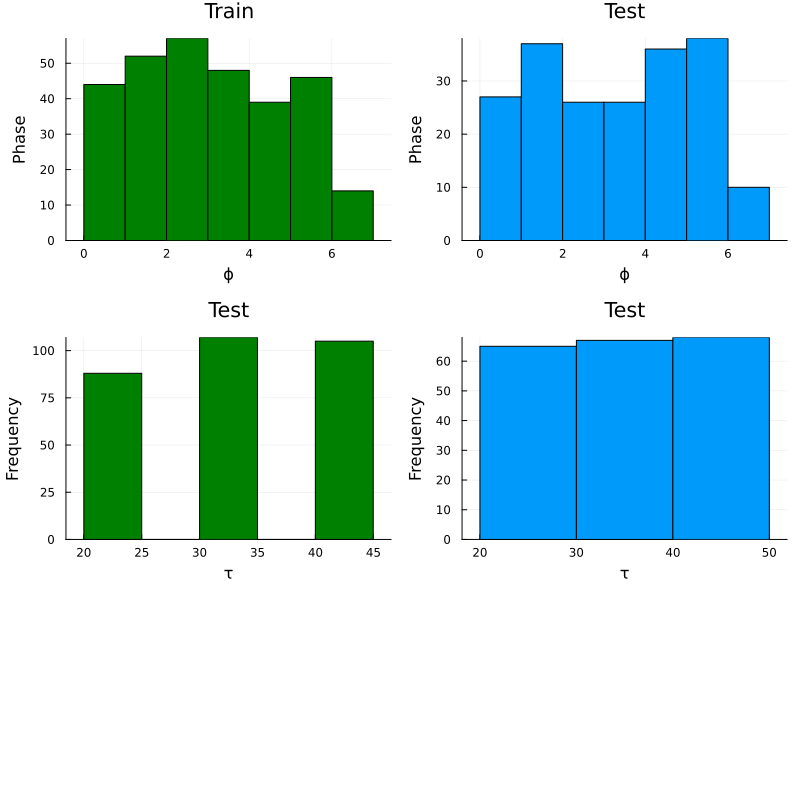

In [486]:
p1 = histogram(stats[:train_phis], ylabel="Phase", xlabel="ϕ", label="", title="Train", c=:green)
p2 = histogram(stats[:test_phis], ylabel="Phase", xlabel="ϕ", label="", title="Test")
p3 = histogram(stats[:train_taus], ylabel="Frequency", xlabel="τ", label="", title="Test", c=:green)
p4 = histogram(stats[:test_taus], ylabel="Frequency", xlabel="τ", label="", title="Test")
plot(p1, p2, p3, p4, layout=(3, 2), size=(800, 800))

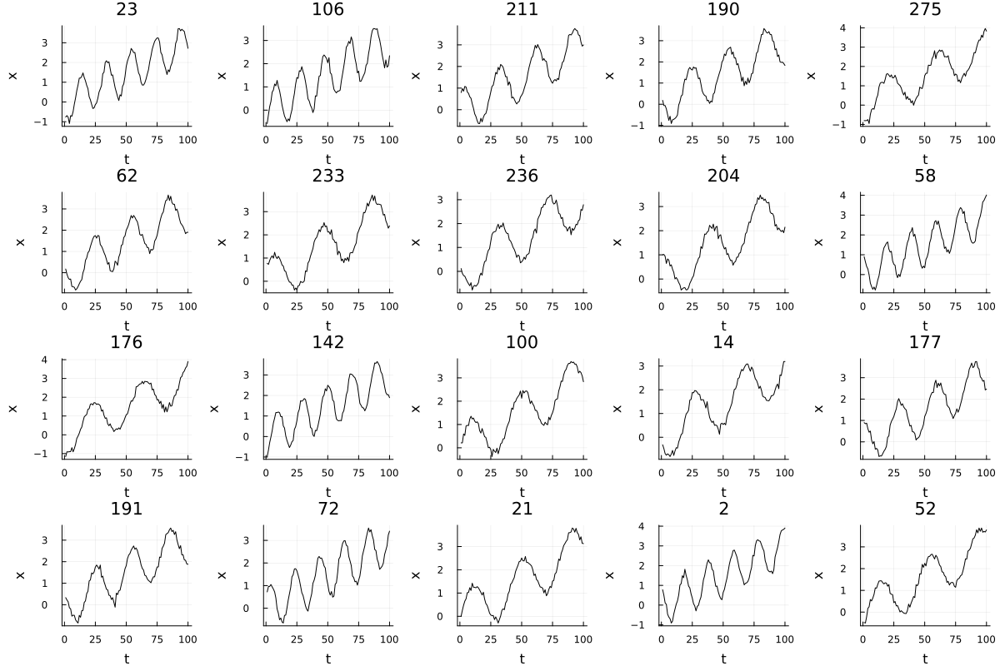

In [487]:
Random.seed!(1)
plot_idxs = sample(1:300, 20; replace=false);
ps = []
for pidx in plot_idxs
    p = plot(X_train[pidx, :], label ="", c=:black, title=pidx, xlabel="t", ylabel="x")
    push!(ps, p)
end
plot(ps..., size=(1200, 800), left_margin=5mm)

In [488]:
jldopen("noisy_trendy_sine_eta_01_m_3_tau_var3.jld2", "w") do f
    f["X_train"] = X_train
    f["y_train"] = y_train
    f["X_test"] = X_test
    f["y_test"] = y_test
    f["stats"] = stats
end

Dict{Symbol, Vector{Float64}} with 4 entries:
  :train_taus => [30.0, 20.0, 30.0, 30.0, 30.0, 40.0, 30.0, 40.0, 20.0, 40.0  ……
  :test_taus  => [40.0, 30.0, 20.0, 20.0, 20.0, 40.0, 20.0, 40.0, 30.0, 30.0  ……
  :train_phis => [6.25569, 2.38114, 2.63021, 1.66468, 3.97737, 3.19031, 3.0487,…
  :test_phis  => [2.29058, 0.806085, 3.72772, 1.45532, 0.93228, 2.20135, 0.8837…

In [204]:
function reconstruct_opts(chis)

    setprecision(BigFloat, 128)
    Rdtype = Float64

    verbosity = 0
    test_run = false
    track_cost = false
    #
    encoding = legendre(project=false)
    encode_classes_separately = false
    train_classes_separately = false

    #encoding = Basis("Legendre")
    dtype = encoding.iscomplex ? ComplexF64 : Float64

    opts_all = []
    for chi in chis
        opts=Options(; nsweeps=30, chi_max=chi,  update_iters=1, verbosity=verbosity, dtype=dtype, loss_grad=loss_grad_KLD,
            bbopt=BBOpt("CustomGD"), track_cost=track_cost, eta=0.05, rescale = (false, true), d=12, aux_basis_dim=2, encoding=encoding, 
            encode_classes_separately=encode_classes_separately, train_classes_separately=train_classes_separately, exit_early=false, sigmoid_transform=true)
        push!(opts_all, opts)
    end

    return opts_all
end;

In [209]:
opts_rec = reconstruct_opts([50]);

In [305]:
function make_fcs(svpaths::Vector{String}, chis::Vector)
    # takes in saved files and makes forecastables for each
    # assumes same training data for each
    fcs = []
    opts_all = reconstruct_opts(chis)
    for (i, svp) in enumerate(svpaths)
        f = jldopen(svp, "r")
        X_train_scaled = read(f, "X_train_scaled")
        y_train = read(f, "y_train")
        X_test_scaled = read(f, "X_test_scaled")
        y_test = read(f, "y_test");
        mps = read(f, "mps")
        info = read(f, "info")
        close(f)
        opts_rec = opts_all[i]
        fc = load_forecasting_info_variables(mps, permutedims(X_train_scaled), 
            y_train, permutedims(X_test_scaled), y_test, opts_rec);
        push!(fcs, fc)
    end
    return fcs
end

make_fcs (generic function with 1 method)

In [315]:
chis = fill(50, 6)
svpaths = ["noisy_trendy_sine_eta_01_m_3_tau_var2_legendre_no_norm_d12_chi50.jld2",
            "noisy_trendy_sine_eta_01_m_var2_tau_20_legendre_no_norm_d12_chi50.jld2",
            "noisy_trendy_sine_eta_01_m_var2_tau_var2_legendre_no_norm_d12_chi50.jld2",
            "noisy_trendy_sine_eta_01_m_var2_tau_var3_legendre_no_norm_d12_chi50.jld2",
            "noisy_trendy_sine_eta_01_m_var3_tau_var2_legendre_no_norm_d12_chi50.jld2",
            "noisy_trendy_sine_eta_01_m_var3_tau_var3_legendre_no_norm_d12_chi50.jld2"]

6-element Vector{String}:
 "noisy_trendy_sine_eta_01_m_3_tau_var2_legendre_no_norm_d12_chi50.jld2"
 "noisy_trendy_sine_eta_01_m_var2_tau_20_legendre_no_norm_d12_chi50.jld2"
 "noisy_trendy_sine_eta_01_m_var2_tau_var2_legendre_no_norm_d12_chi50.jld2"
 "noisy_trendy_sine_eta_01_m_var2_tau_var3_legendre_no_norm_d12_chi50.jld2"
 "noisy_trendy_sine_eta_01_m_var3_tau_var2_legendre_no_norm_d12_chi50.jld2"
 "noisy_trendy_sine_eta_01_m_var3_tau_var3_legendre_no_norm_d12_chi50.jld2"

In [316]:
all_fcs = make_fcs(svpaths, chis);

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
                         Summary:

 - Dataset has 300 training samples and 200 testing samples.
 - 1 class(es) was detected. Slicing MPS into individual states...
 - Time independent encoding - Legendre_No_Norm - detected.
 - d = 12, chi_max = 50

 Created 1 forecastable struct(s) containing class-wise mps and test samples.
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
                         Summary:

 - Dataset has 300 training samples and 200 testing samples.
 - 1 class(es) was detected. Slicing MPS into individual states...
 - Time independent encoding - Legendre_No_Norm - detected.
 - d = 12, chi_max = 50

 Created 1 forecastable struct(s) containing class-wise mps and test samples.
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
                         Summary:

 - Dataset has 300 training samples and 200 testing samples.
 - 1 class(es) was detected. Slicing MPS into individual states...
 -

Starting with dataset 1:

In [342]:
cpts = 1:2:99
scores_d1 = []
for cpt in cpts
    println("Evaluating $cpt...")
    sc = forecast_all(all_fcs[1], :directMean, cpt)
    push!(scores_d1, sc[1])
end

Evaluating 1...
There are 1 classes. Evaluating all...
Evaluating 3...
There are 1 classes. Evaluating all...
Evaluating 5...
There are 1 classes. Evaluating all...
Evaluating 7...
There are 1 classes. Evaluating all...
Evaluating 9...
There are 1 classes. Evaluating all...
Evaluating 11...
There are 1 classes. Evaluating all...
Evaluating 13...
There are 1 classes. Evaluating all...
Evaluating 15...
There are 1 classes. Evaluating all...
Evaluating 17...
There are 1 classes. Evaluating all...
Evaluating 19...
There are 1 classes. Evaluating all...
Evaluating 21...
There are 1 classes. Evaluating all...
Evaluating 23...
There are 1 classes. Evaluating all...
Evaluating 25...
There are 1 classes. Evaluating all...
Evaluating 27...
There are 1 classes. Evaluating all...
Evaluating 29...
There are 1 classes. Evaluating all...
Evaluating 31...
There are 1 classes. Evaluating all...
Evaluating 33...
There are 1 classes. Evaluating all...
Evaluating 35...
There are 1 classes. Evaluating all.

In [343]:
score_array_d1 = hcat(scores_d1...);
mean_scores_d1 = reverse(mean(score_array_d1; dims=1)[1,:]);
median_scores_d1 = reverse(median(score_array_d1; dims=1)[1,:]);
std_scores_d1 = reverse(std(score_array_d1; dims=1)[1,:])

50-element Vector{Float64}:
 0.15510712425035916
 0.14546757615494268
 0.12439060507253441
 0.07392138369237876
 0.0299819372205364
 0.016106543363073194
 0.01583390841040895
 0.015690001689840687
 0.012949095641612219
 0.012591137198316876
 ⋮
 0.012034989597361998
 0.013445856475635187
 0.01390321715641576
 0.015087382348593931
 0.015500110118921938
 0.01598629206208024
 0.019189280490606985
 0.02351159917137293
 0.03818009514656109

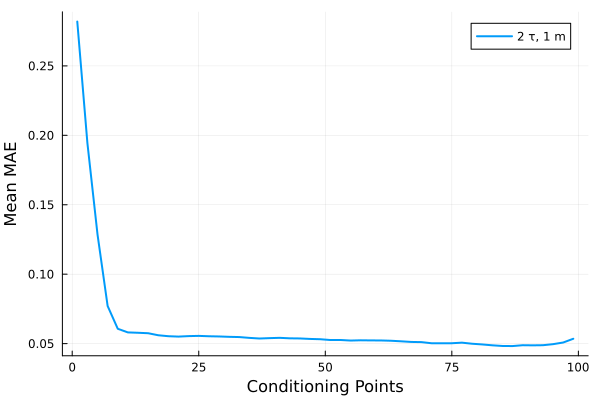

In [349]:
plot(collect(cpts), mean_scores_d1, label = "2 τ, 1 m", lw=2, xlabel="Conditioning Points", ylabel="Mean MAE")

In [ ]:
noisy_trendy_sine_eta_01_m_3_tau_var2

In [350]:
# save results 
jldopen("noisy_trendy_sine_eta_01_m_3_tau_var2_chi50_results.jld2", "w") do f
   f["mean_scores"] = mean_scores_d1
   f["std_scores"] = std_scores_d1
end

50-element Vector{Float64}:
 0.15510712425035916
 0.14546757615494268
 0.12439060507253441
 0.07392138369237876
 0.0299819372205364
 0.016106543363073194
 0.01583390841040895
 0.015690001689840687
 0.012949095641612219
 0.012591137198316876
 ⋮
 0.012034989597361998
 0.013445856475635187
 0.01390321715641576
 0.015087382348593931
 0.015500110118921938
 0.01598629206208024
 0.019189280490606985
 0.02351159917137293
 0.03818009514656109

Dataset 2

In [351]:
scores_d2 = []
for cpt in cpts
    println("Evaluating $cpt...")
    sc = forecast_all(all_fcs[2], :directMean, cpt)
    push!(scores_d2, sc[1])
end

Evaluating 1...
There are 1 classes. Evaluating all...
Evaluating 3...
There are 1 classes. Evaluating all...
Evaluating 5...
There are 1 classes. Evaluating all...
Evaluating 7...
There are 1 classes. Evaluating all...
Evaluating 9...
There are 1 classes. Evaluating all...
Evaluating 11...
There are 1 classes. Evaluating all...
Evaluating 13...
There are 1 classes. Evaluating all...
Evaluating 15...
There are 1 classes. Evaluating all...
Evaluating 17...
There are 1 classes. Evaluating all...
Evaluating 19...
There are 1 classes. Evaluating all...
Evaluating 21...
There are 1 classes. Evaluating all...
Evaluating 23...
There are 1 classes. Evaluating all...
Evaluating 25...
There are 1 classes. Evaluating all...
Evaluating 27...
There are 1 classes. Evaluating all...
Evaluating 29...
There are 1 classes. Evaluating all...
Evaluating 31...
There are 1 classes. Evaluating all...
Evaluating 33...
There are 1 classes. Evaluating all...
Evaluating 35...
There are 1 classes. Evaluating all.

In [352]:
score_array_d2 = hcat(scores_d2...);
mean_scores_d2 = reverse(mean(score_array_d2; dims=1)[1,:]);
median_scores_d2 = reverse(median(score_array_d2; dims=1)[1,:]);
std_scores_d2 = reverse(std(score_array_d2; dims=1)[1,:])

50-element Vector{Float64}:
 0.3552855219248236
 0.3992888938877214
 0.3912884712578123
 0.31786124364644447
 0.1949773154593268
 0.06189129553149146
 0.004939350806285568
 0.004706615403469963
 0.004601033319446745
 0.004717658838636286
 ⋮
 0.00652049080872026
 0.0071392767786152885
 0.007282265629080767
 0.007618141631289336
 0.009103909836672653
 0.010073368785376294
 0.012236507236363926
 0.016126729228031135
 0.025003068449596672

In [353]:
# save results 
jldopen("noisy_trendy_sine_eta_01_m_var2_tau_20_chi50_results.jld2", "w") do f
    f["mean_scores"] = mean_scores_d2
    f["std_scores"] = std_scores_d2
 end

50-element Vector{Float64}:
 0.3552855219248236
 0.3992888938877214
 0.3912884712578123
 0.31786124364644447
 0.1949773154593268
 0.06189129553149146
 0.004939350806285568
 0.004706615403469963
 0.004601033319446745
 0.004717658838636286
 ⋮
 0.00652049080872026
 0.0071392767786152885
 0.007282265629080767
 0.007618141631289336
 0.009103909836672653
 0.010073368785376294
 0.012236507236363926
 0.016126729228031135
 0.025003068449596672

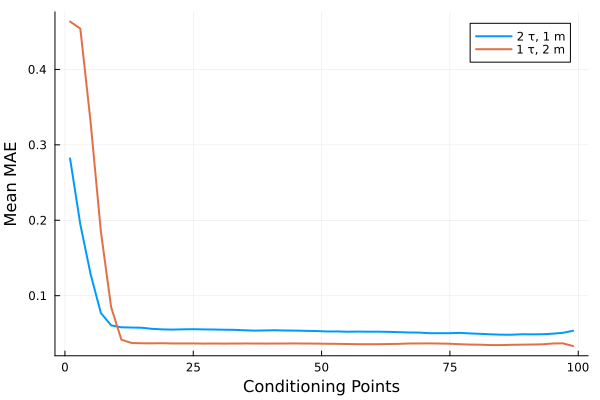

In [430]:
plot(collect(cpts), mean_scores_d1, label = "2 τ, 1 m", lw=2, xlabel="Conditioning Points", ylabel="Mean MAE")
plot!(collect(cpts), mean_scores_d2, label = "1 τ, 2 m", lw=2)

Larger initial error for the two trends becuase the MPS predicting the incorrect gradient will almost always result in a much larger MAE than if it were to predict the wrong period (as is the case for the blue curve).

In [428]:
f = jldopen("noisy_trendy_sine_eta_01_m_var2_tau_var2_chi50_results.jld2", "r");
mean_scores_d3 = read(f, "mean_scores")
std_scores_d3 = read(f, "std_scores")

50-element Vector{Float64}:
 0.32862859846075837
 0.36985551561295266
 0.3937920337969319
 0.4033621607363836
 0.3767715856884958
 0.29385525957705244
 0.2501778870287486
 0.22754559282275666
 0.17755223546741314
 0.06829766571377241
 ⋮
 0.021513031801175725
 0.013912921114423892
 0.013773762383709833
 0.01445434370539402
 0.015742257254934545
 0.015573375586397093
 0.015544374699402792
 0.018662784221064176
 0.027028518642858785

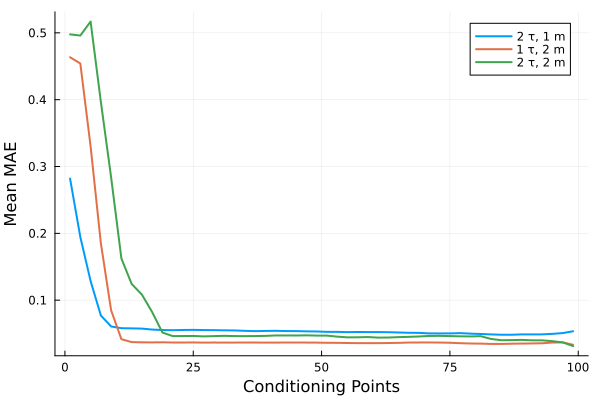

In [431]:
plot(collect(cpts), mean_scores_d1, label = "2 τ, 1 m", lw=2, xlabel="Conditioning Points", ylabel="Mean MAE")
plot!(collect(cpts), mean_scores_d2, label = "1 τ, 2 m", lw=2)
plot!(collect(cpts), mean_scores_d3, label = "2 τ, 2 m", lw=2)

In [437]:
f = jldopen("noisy_trendy_sine_eta_01_m_var2_tau_var3_chi50_results.jld2", "r");
mean_scores_d4 = read(f, "mean_scores")
std_scores_d4 = read(f, "std_scores")

50-element Vector{Float64}:
 0.3247532743311954
 0.33582986147139177
 0.3493470320479816
 0.34748698899917235
 0.313465064166096
 0.2845322540823036
 0.23385147719921553
 0.17859068416876195
 0.12572883748253016
 0.06610612702911524
 ⋮
 0.02907373580302783
 0.02978428756857576
 0.030414529485318233
 0.031381507071984956
 0.030767962236448117
 0.022927951214781587
 0.016805088281427974
 0.016810326875941563
 0.026634869459443038

In [438]:
f = jldopen("noisy_trendy_sine_eta_01_m_var3_tau_var2_chi50_results.jld2", "r");
mean_scores_d5 = read(f, "mean_scores")
std_scores_d5 = read(f, "std_scores")

50-element Vector{Float64}:
 0.2777523720246803
 0.283275696317745
 0.29289464158280354
 0.28686173400936393
 0.2796625463353431
 0.2839003670651409
 0.27477157228854104
 0.26272433568603343
 0.26725320403749636
 0.2547677840881008
 ⋮
 0.05557832924824363
 0.05356607052563247
 0.04770291259717238
 0.0503072815379881
 0.052657121833398206
 0.04833241099043282
 0.03498980744646268
 0.02863076637055829
 0.035176399349411115

In [440]:
f = jldopen("noisy_trendy_sine_eta_01_m_var3_tau_var3_chi50_results.jld2", "r");
mean_scores_d6 = read(f, "mean_scores")
std_scores_d6 = read(f, "std_scores")

50-element Vector{Float64}:
 0.2450297043872209
 0.23726246771784146
 0.23636036711887853
 0.22229581355047484
 0.23650296566562415
 0.23770816532786018
 0.22846549313202827
 0.23951950650287662
 0.23801679017839422
 0.22408403745504155
 ⋮
 0.05830835953888312
 0.0535639854320598
 0.05557348398912306
 0.05585741689667883
 0.05041521638093451
 0.040108193300652836
 0.03786724732160443
 0.03260641400965052
 0.04229236579016144

In [701]:
f = jldopen("noisy_trendy_sine_eta_01_m_var3_tau_20_chi50_results.jld2", "r");
mean_scores_d7 = read(f, "mean_scores")
std_scores_d7 = read(f, "std_scores")

50-element Vector{Float64}:
 0.24298712930658914
 0.26319830430954483
 0.26409961352423394
 0.24738859634531984
 0.22689546849262388
 0.17856413623406162
 0.11698140833013312
 0.052467690077376936
 0.010488707243395609
 0.009577495914182154
 ⋮
 0.010527849860850676
 0.011377918049340028
 0.012368553034953034
 0.012848309445890832
 0.012532680430478732
 0.011092622625116543
 0.013712363095409616
 0.016370262102623618
 0.03124124063686241

In [758]:
f = jldopen("noisy_trendy_sine_eta_01_m_3_tau_var3_chi50_results.jld2", "r");
mean_scores_d8 = read(f, "mean_scores")
std_scores_d8 = read(f, "std_scores")

50-element Vector{Float64}:
 0.1289763263860243
 0.1450832522656025
 0.15266937011923773
 0.1496878262397707
 0.1438323207796056
 0.12949173577928824
 0.1430788069955442
 0.13868145632871878
 0.12418000006704215
 0.1197749912751034
 ⋮
 0.04812712802465223
 0.048400067037179625
 0.044333501809053565
 0.03197821370508468
 0.023721662254737225
 0.022646113123775926
 0.022112438982239926
 0.0258756678291101
 0.042233385584166554

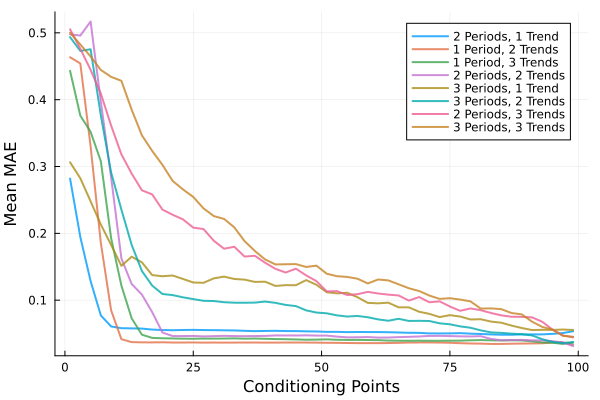

In [759]:
plot(collect(cpts), mean_scores_d1, label = "2 Periods, 1 Trend", lw=2, 
    xlabel="Conditioning Points", ylabel="Mean MAE", alpha=0.8)
plot!(collect(cpts), mean_scores_d2, label = "1 Period, 2 Trends", lw=2, alpha=0.8)
plot!(collect(cpts), mean_scores_d7, label = "1 Period, 3 Trends", lw=2, alpha=0.8)
plot!(collect(cpts), mean_scores_d3, label = "2 Periods, 2 Trends", lw=2, alpha=0.8)
plot!(collect(cpts), mean_scores_d8, label = "3 Periods, 1 Trend", lw=2, alpha=0.8)
plot!(collect(cpts), mean_scores_d4, label = "3 Periods, 2 Trends", lw=2, alpha=0.8)
plot!(collect(cpts), mean_scores_d5, label = "2 Periods, 3 Trends", lw=2, alpha=0.8)
plot!(collect(cpts), mean_scores_d6, label = "3 Periods, 3 Trends", lw=2, alpha=0.8)
#savefig("complex_trendy_sine_meanMAE.svg")

Comparisons

(1) Fixed Period, Multiple Trends

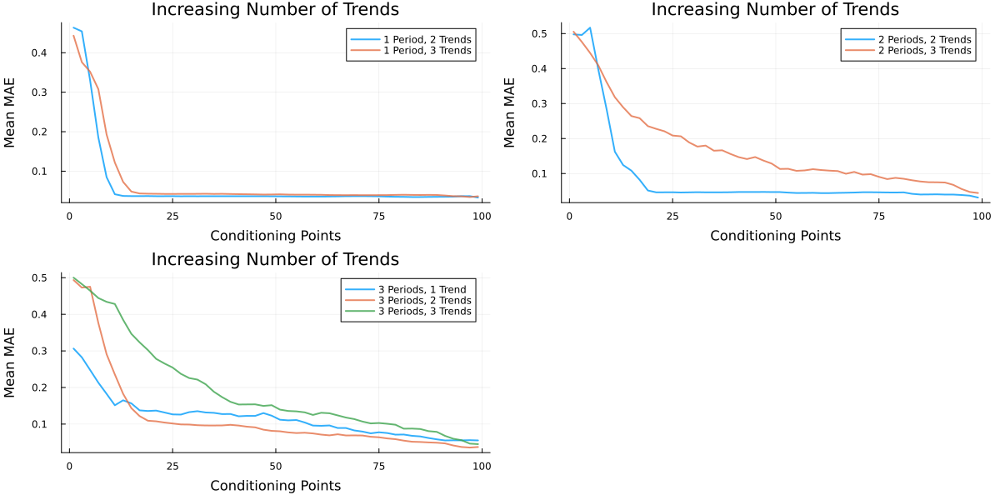

In [774]:
p1 = plot(collect(cpts), mean_scores_d2, label = "1 Period, 2 Trends", lw=2, alpha=0.8, 
    xlabel="Conditioning Points", ylabel="Mean MAE", title="Increasing Number of Trends")
p1 = plot!(collect(cpts), mean_scores_d7, label = "1 Period, 3 Trends", lw=2, alpha=0.8)

p2 = plot(collect(cpts), mean_scores_d3, label = "2 Periods, 2 Trends", lw=2, alpha=0.8, 
    xlabel="Conditioning Points", ylabel="Mean MAE", title="Increasing Number of Trends")
p2 = plot!(collect(cpts), mean_scores_d5, label = "2 Periods, 3 Trends", lw=2, alpha=0.8)

p3 = plot(collect(cpts), mean_scores_d8, label = "3 Periods, 1 Trend", lw=2, alpha=0.8,
    xlabel="Conditioning Points", ylabel="Mean MAE", title="Increasing Number of Trends")
p3 = plot!(collect(cpts), mean_scores_d4, label = "3 Periods, 2 Trends", lw=2, alpha=0.8)
p3 = plot!(collect(cpts), mean_scores_d6, label = "3 Periods, 3 Trends", lw=2, alpha=0.8)

plot(p1, p2, p3, size=(1200, 600), bottom_margin=5mm, left_margin=5mm)

Plotting the best examples from the most difficult dataset (3 periods, 3 trends)

In [681]:
scores_20 = forecast_all(all_fcs[6], :directMean, 80)

There are 1 classes. Evaluating all...


1-element Vector{Any}:
 Any[0.20150448533541346, 0.5907510460320702, 0.10075010337793841, 0.03958705101129778, 0.22808811266252693, 0.5913339840147812, 0.22029686496479947, 0.05272902861509125, 0.17100649765770673, 0.26035248477819806  …  0.21118811033178603, 0.12384425017390226, 0.3422436893510429, 0.14147593017954413, 0.3064444687923024, 0.5630605033619007, 0.606631989897269, 0.040047535477681126, 0.32450828983503405, 0.20784646208744909]

In [690]:
sortperm(scores_20[1])[1:10]

10-element Vector{Int64}:
 152
  75
  87
 104
 165
 106
   4
 123
 198
 143

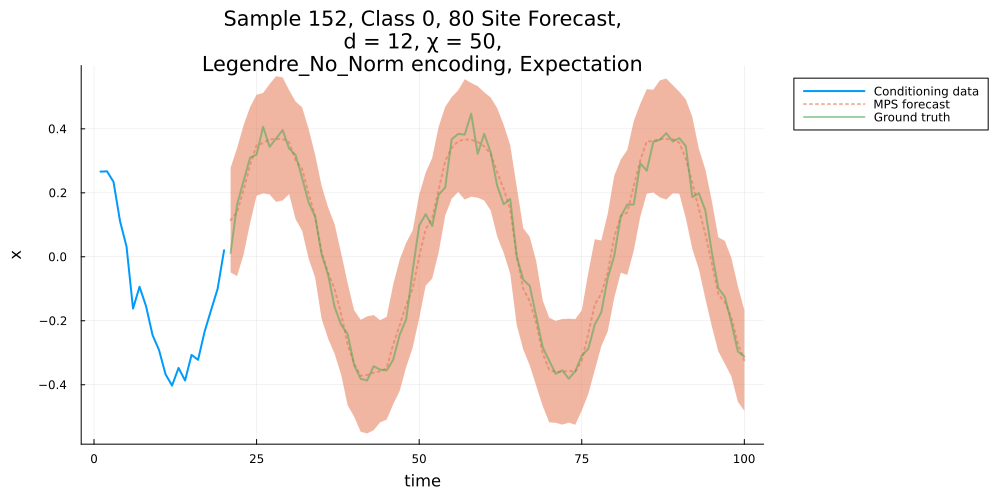

╭────────┬────────────╮
│ Metric │      Value │
├────────┼────────────┤
│  SMAPE │   0.254273 │
│    MSE │ 0.00145356 │
│   MAPE │   0.586117 │
│    MAE │  0.0301287 │
│   RMSE │ 0.00145356 │
╰────────┴────────────╯


"/Users/joshua/QTNMLAUG/complex_trendy_sine_ex1.svg"

In [711]:
forward_interpolate_single_time_series(all_fcs[6], 0, 152, 80, :directMean)
#savefig("complex_trendy_sine_ex1.svg")

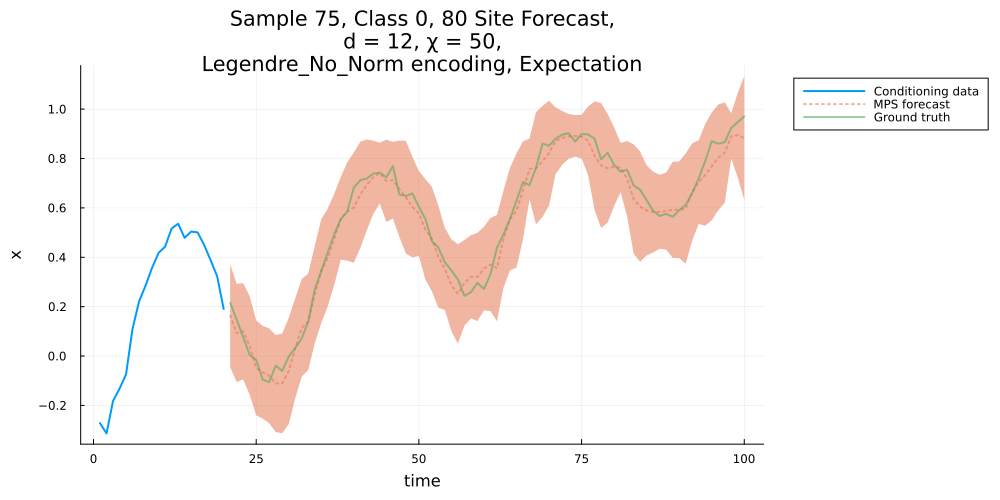

╭────────┬────────────╮
│ Metric │      Value │
├────────┼────────────┤
│  SMAPE │   0.154319 │
│    MSE │ 0.00180025 │
│   MAPE │   0.593118 │
│    MAE │  0.0344542 │
│   RMSE │ 0.00180025 │
╰────────┴────────────╯


"/Users/joshua/QTNMLAUG/complex_trendy_sine_ex2.svg"

In [712]:
forward_interpolate_single_time_series(all_fcs[6], 0, 75, 80, :directMean)
#savefig("complex_trendy_sine_ex2.svg")

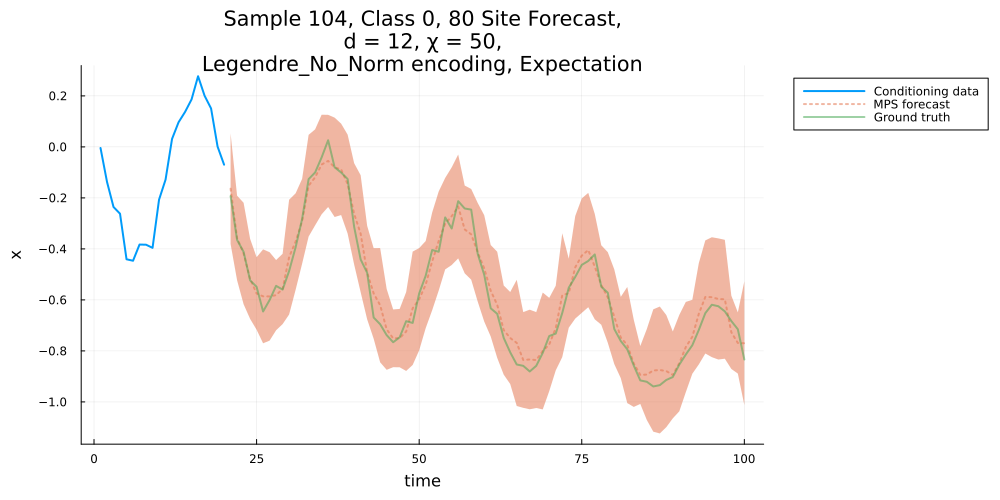

╭────────┬───────────╮
│ Metric │     Value │
├────────┼───────────┤
│  SMAPE │   0.10263 │
│    MSE │  0.001852 │
│   MAPE │  0.118903 │
│    MAE │ 0.0355509 │
│   RMSE │  0.001852 │
╰────────┴───────────╯


"/Users/joshua/QTNMLAUG/complex_trendy_sine_ex3.svg"

In [713]:
forward_interpolate_single_time_series(all_fcs[6], 0, 104, 80, :directMean)
#savefig("complex_trendy_sine_ex3.svg")

In [698]:
scores_40 = forecast_all(all_fcs[6], :directMean, 60)

There are 1 classes. Evaluating all...


1-element Vector{Any}:
 Any[0.03820618219279257, 0.046301963900671136, 0.10271629918953891, 0.039413458622591636, 0.6642430388916515, 0.1759311078835097, 0.1654989055277576, 0.05997995204779279, 0.2044900205447289, 0.18160847964187685  …  0.048081442145917044, 0.08526703287647379, 0.2624144432648903, 0.17476523143163064, 0.30765626318881434, 0.13227829778746897, 0.1511257352669556, 0.04048717718802955, 0.3040014402021041, 0.17465222353359314]

In [699]:
sortperm(scores_40[1])[1:10]

10-element Vector{Int64}:
  68
 152
 165
  20
  75
 106
  87
 104
 143
   1

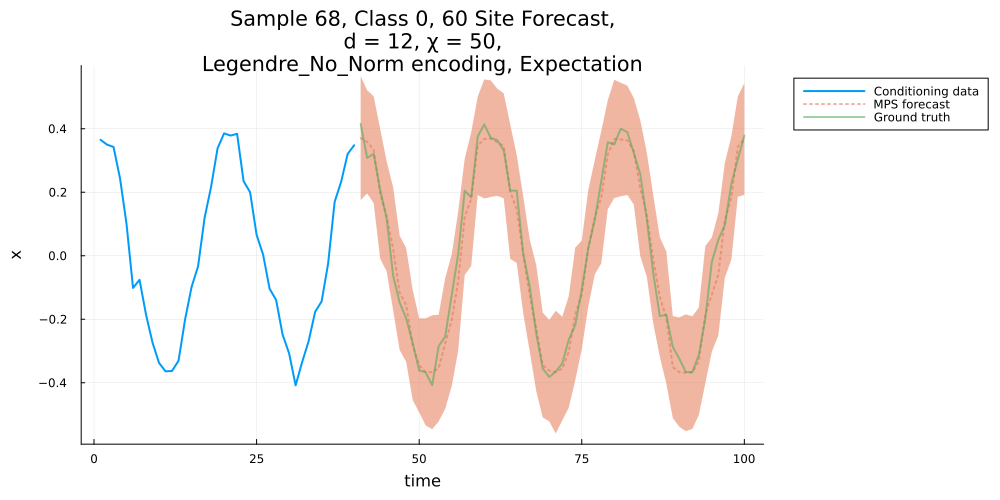

╭────────┬────────────╮
│ Metric │      Value │
├────────┼────────────┤
│  SMAPE │   0.261684 │
│    MSE │ 0.00167726 │
│   MAPE │    0.57374 │
│    MAE │   0.030928 │
│   RMSE │ 0.00167726 │
╰────────┴────────────╯


"/Users/joshua/QTNMLAUG/complex_trendy_sine_ex4.svg"

In [714]:
forward_interpolate_single_time_series(all_fcs[6], 0, 68, 60, :directMean);
#savefig("complex_trendy_sine_ex4.svg")

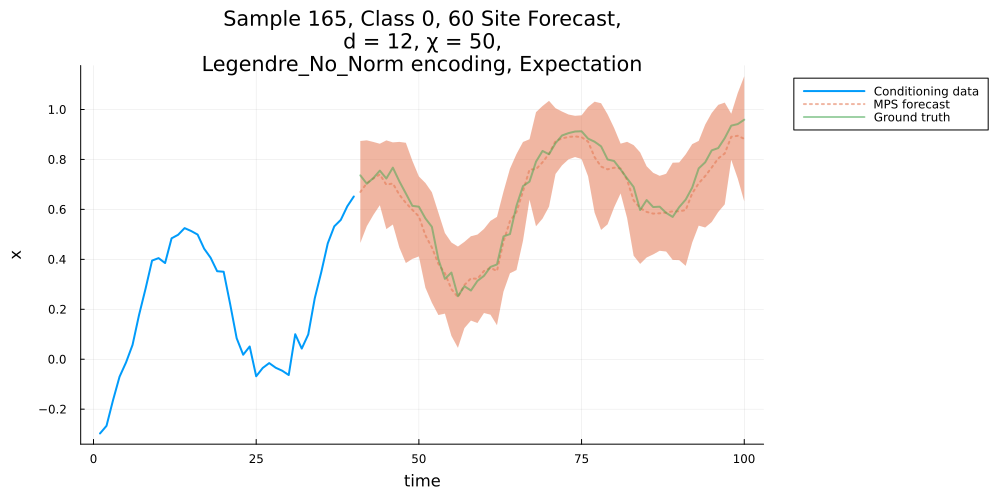

╭────────┬───────────╮
│ Metric │     Value │
├────────┼───────────┤
│  SMAPE │ 0.0529535 │
│    MSE │ 0.0015994 │
│   MAPE │ 0.0516552 │
│    MAE │ 0.0328081 │
│   RMSE │ 0.0015994 │
╰────────┴───────────╯


"/Users/joshua/QTNMLAUG/complex_trendy_sine_ex5.svg"

In [715]:
forward_interpolate_single_time_series(all_fcs[6], 0, 165, 60, :directMean);
#savefig("complex_trendy_sine_ex5.svg")

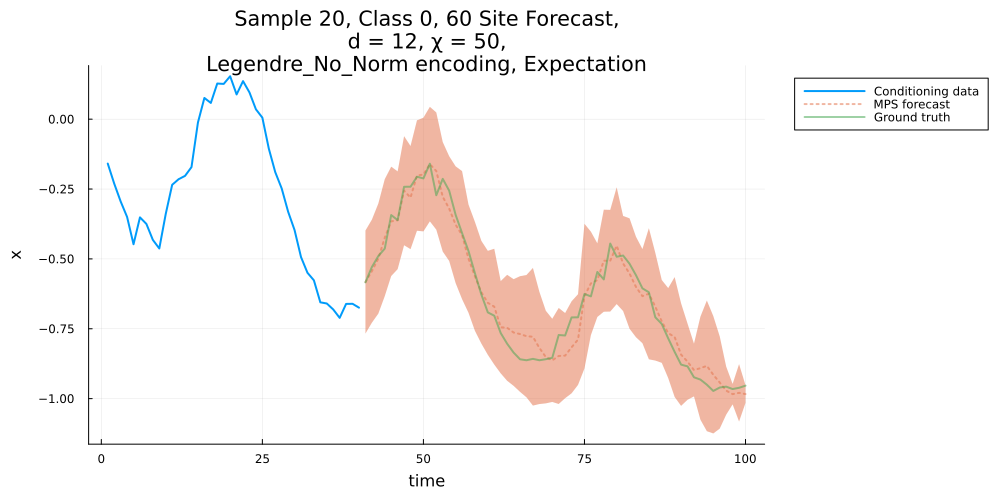

╭────────┬────────────╮
│ Metric │      Value │
├────────┼────────────┤
│  SMAPE │  0.0654563 │
│    MSE │ 0.00203197 │
│   MAPE │  0.0657552 │
│    MAE │  0.0363777 │
│   RMSE │ 0.00203197 │
╰────────┴────────────╯


"/Users/joshua/QTNMLAUG/complex_trendy_sine_ex6.svg"

In [716]:
forward_interpolate_single_time_series(all_fcs[6], 0, 20, 60, :directMean);
#savefig("complex_trendy_sine_ex6.svg")

In [719]:
scores_60 = forecast_all(all_fcs[6], :directMean, 40)

There are 1 classes. Evaluating all...


1-element Vector{Any}:
 Any[0.042494740934974504, 0.04880426622305799, 0.0678273785893965, 0.041889792843993315, 0.11134863949882809, 0.0513335693030912, 0.16795396038996857, 0.06623281114064787, 0.09585982165145125, 0.07429313734620638  …  0.04767520148940548, 0.06161576166896093, 0.298490565283711, 0.16895417152339645, 0.15269965955106418, 0.23689247729593968, 0.11827524321990565, 0.04414748937224139, 0.31024097948480034, 0.17412717758441215]

In [746]:
sortperm(scores_60[1])[21:40]

20-element Vector{Int64}:
  39
 191
   2
  63
 160
   6
  97
 101
 149
 145
 119
 159
  87
  84
  89
 190
  42
 117
 124
 136

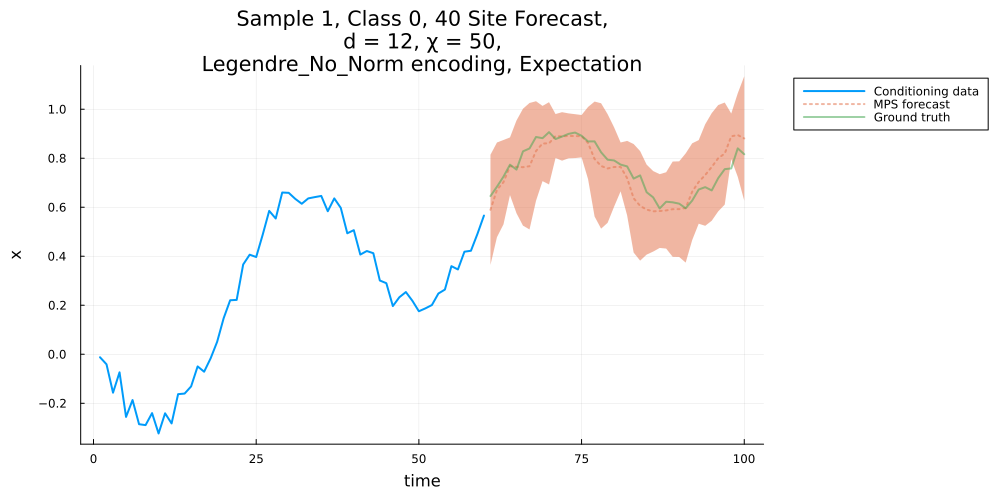

╭────────┬────────────╮
│ Metric │      Value │
├────────┼────────────┤
│  SMAPE │  0.0576533 │
│    MSE │ 0.00285169 │
│   MAPE │  0.0571924 │
│    MAE │  0.0424947 │
│   RMSE │ 0.00285169 │
╰────────┴────────────╯


Dict{Symbol, Float64} with 5 entries:
  :SMAPE => 0.0576533
  :MSE   => 0.00285169
  :MAPE  => 0.0571924
  :MAE   => 0.0424947
  :RMSE  => 0.00285169

In [735]:
forward_interpolate_single_time_series(all_fcs[6], 0, 1, 40, :directMean);
#savefig("complex_trendy_sine_ex7.svg")

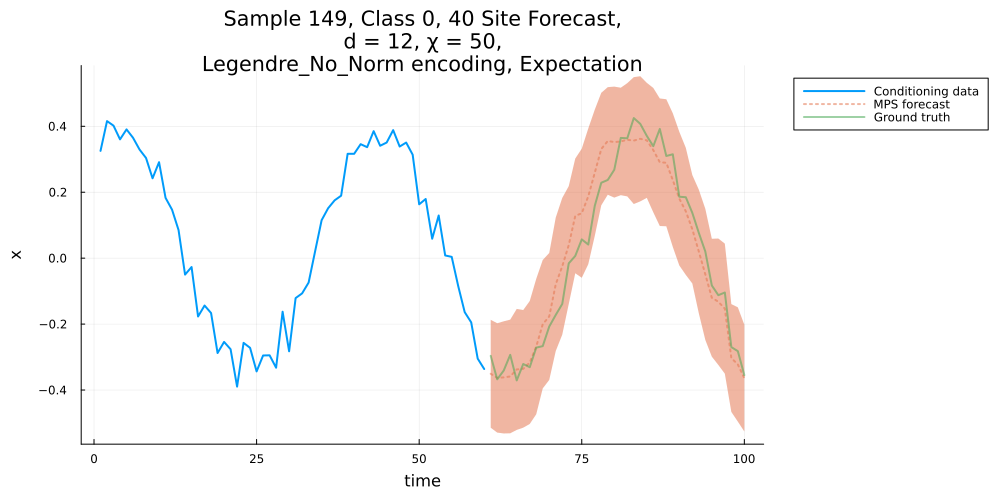

╭────────┬────────────╮
│ Metric │      Value │
├────────┼────────────┤
│  SMAPE │   0.419258 │
│    MSE │ 0.00416152 │
│   MAPE │   0.950181 │
│    MAE │  0.0522059 │
│   RMSE │ 0.00416152 │
╰────────┴────────────╯


Dict{Symbol, Float64} with 5 entries:
  :SMAPE => 0.419258
  :MSE   => 0.00416152
  :MAPE  => 0.950181
  :MAE   => 0.0522059
  :RMSE  => 0.00416152

In [757]:
forward_interpolate_single_time_series(all_fcs[6], 0, 149, 40, :directMean);
#savefig("complex_trendy_sine_ex8.svg")

In [503]:
# fnew = jldopen("noisy_trendy_sine_eta_01_m_var3_tau_var3_legendre_no_norm_d12_chi50.jld2", "r")
# X_train_scaled = read(fnew, "X_train_scaled")
# y_train = read(fnew, "y_train");

╭────────┬────────────╮
│ Metric │      Value │
├────────┼────────────┤
│  SMAPE │   0.407733 │
│    MSE │ 0.00350184 │
│   MAPE │    1.89159 │
│    MAE │  0.0470453 │
│   RMSE │ 0.00350184 │
╰────────┴────────────╯


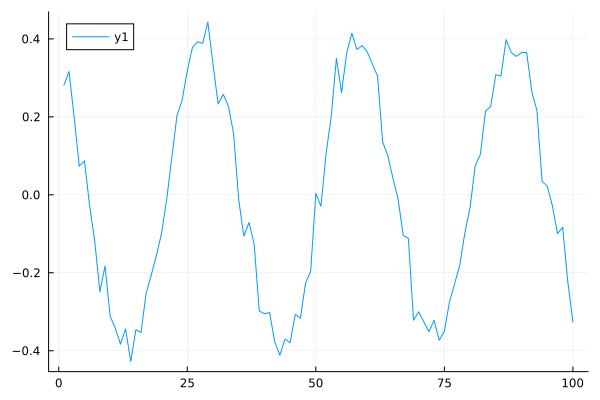

In [692]:
# met, ts = MSE_interpolate(all_fcs[6], 0, 152, collect(20:100); X_train_scaled=permutedims(X_train_scaled), y_train);
# plot(ts)